In [1]:
import anndata as ad
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

from sklearn.linear_model import ElasticNet
from sklearn.model_selection import GridSearchCV

from scipy.stats import spearmanr
from scipy.stats import pearsonr

import seaborn as sns
import matplotlib.colors as mcolors
from sklearn.metrics import pairwise_distances

from bin import utils

In [2]:
fdata = ad.read_h5ad("./RNA/Multitime.clustered.h5")
cdata = ad.read_h5ad("./RNA/Multitime.guide.h5")

In [3]:
annotation = ad.read_h5ad("./RNA/Multitime.annotation.h5")

In [4]:
annotation.obs["cov"] = [marker + "_" + str(array[0] // 100 * 100) + "-" + str(array[1] // 100 * 100) for marker, array in zip(annotation.obs["marker"], annotation.obsm["spatial"])]
fdata.obs["cov"] = [marker + "_" + str(array[0] // 100 * 100) + "-" + str(array[1] // 100 * 100) for marker, array in zip(fdata.obs["marker"], fdata.obsm["spatial"])]

In [5]:
map_df = fdata.obs[["cluster_cellcharter_givenk", "cov"]]
map_df.index = fdata.obs["cov"]
map_df = map_df.iloc[:, :-1].unstack()
map_dict = map_df["cluster_cellcharter_givenk"].to_dict()
annotation.obs["cluster"] = annotation.obs["cov"].map(map_dict)

In [6]:
interaction_threshold = 30

In [7]:
annotation = annotation[~annotation.obs["cluster"].isna()]

In [8]:
t_types = np.unique(annotation.obs["annotations"][annotation.obs["annotations"].str.endswith("T")])

In [222]:
r_dict = {}
for marker in np.unique(annotation.obs["marker"]):
    r_dict[marker] = {}
    for cluster in tqdm(np.unique(annotation.obs["cluster"])):
        r_dict[marker][cluster] = {}
        for t_type in t_types:
            annotation_ = annotation[(annotation.obs["marker"] == marker) & (annotation.obs["cluster"] == cluster)]
            t_cell_idx = np.where(annotation_.obs["annotations"] == t_type)[0]
            m_cell_idx = np.where(annotation_.obs["annotations"] == "Macrophages")[0]
            if len(t_cell_idx) == 0 or len(m_cell_idx) == 0:
                r_dict[marker][cluster][t_type] = 0
                continue
            coords = annotation_.obsm["spatial"]
            distances = pairwise_distances(coords[t_cell_idx], coords[m_cell_idx])
            interactions = np.sum(distances < interaction_threshold)
            r_dict[marker][cluster][t_type] = interactions / len(t_cell_idx)

100%|██████████| 12/12 [00:06<00:00,  1.98it/s]


In [224]:
p_df = pd.DataFrame()
for marker in np.unique(annotation.obs["marker"]):
    new_df = pd.DataFrame(r_dict[marker])
    p_df = pd.concat([p_df, new_df])
p_df["marker"] = ['1-1'] * 5 + ['1-2'] * 5 + ['2-1'] * 5 + ['2-2'] * 5 + ['3-1'] * 5 + ['3-2'] * 5
p_df.set_index(['marker', p_df.index], inplace=True)

/tmp/ipykernel_19572/969183981.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="variable", y="value", data=data, ax=ax[idx], palette=color_dict)
/tmp/ipykernel_19572/969183981.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[idx].set_xticklabels(labels=p_df.loc[marker].index, rotation=90)
/tmp/ipykernel_19572/969183981.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="variable", y="value", data=data, ax=ax[idx], palette=color_dict)
/tmp/ipykernel_19572/969183981.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocat

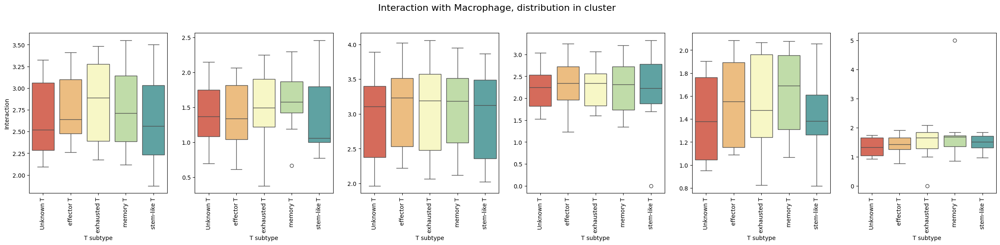

In [231]:
fig, ax = plt.subplots(1, 6, figsize=(30, 5))
colors = sns.color_palette("Spectral", len(t_types))
color_dict = dict(zip(t_types, colors))
for idx, marker in enumerate(np.unique(annotation.obs["marker"])):
    data = p_df.loc[marker].T.melt()
    
    sns.boxplot(x="variable", y="value", data=data, ax=ax[idx], palette=color_dict)
    ax[idx].set_xticklabels(labels=p_df.loc[marker].index, rotation=90)
    ax[idx].set_xlabel("T subtype")
    if idx == 0: ax[idx].set_ylabel("Interaction")
    else: ax[idx].set_ylabel("")

# 调整标题位置
plt.suptitle("Interaction with Macrophage, distribution in cluster", fontsize=16, y=1.02)

# 调整子图之间的间隔
plt.subplots_adjust(wspace=0.2)

plt.show()

# Pic

In [22]:
np.array([])

array([], dtype=float64)

In [56]:
r_dict = {}
for marker in np.unique(annotation.obs["marker"]):
    r_dict[marker] = {}
    for cluster in tqdm(np.unique(annotation.obs["cluster"])):
        r_dict[marker][cluster] = {}
        for t_type in t_types:
            annotation_ = annotation[(annotation.obs["marker"] == marker) & (annotation.obs["cluster"] == cluster)]
            t_cell_idx = np.where(annotation_.obs["annotations"] == t_type)[0]
            m_cell_idx = np.where(annotation_.obs["annotations"] == "Macrophages")[0]
            if len(t_cell_idx) == 0 or len(m_cell_idx) == 0:
                r_dict[marker][cluster][t_type] = []
                continue
            coords = annotation_.obsm["spatial"]
            distances = pairwise_distances(coords[t_cell_idx], coords[m_cell_idx])
            close = distances < interaction_threshold
            for i in range(close.shape[1]):
                try:
                    r_dict[marker][cluster][t_type] = np.append(r_dict[marker][cluster][t_type], np.array(coords[t_cell_idx][close[:, i]]), axis=0)
                    # print(r_dict[marker][cluster][t_type], np.array(coords[t_cell_idx][close[:, i]]))
                except:
                    r_dict[marker][cluster][t_type] = np.array(coords[t_cell_idx][close[:, i]])

100%|██████████| 12/12 [00:15<00:00,  1.31s/it]


/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


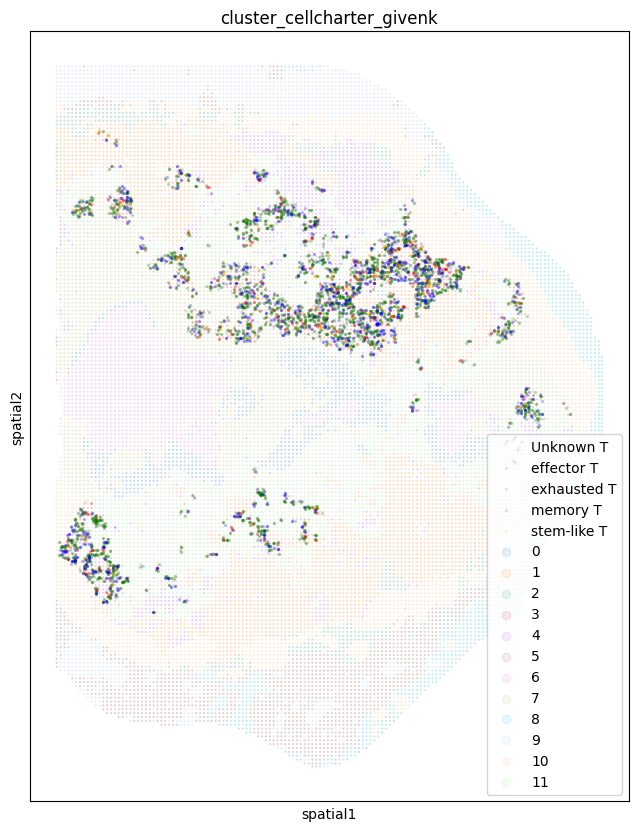

In [91]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
color_map = {
    'Unknown T': 'White',
    'effector T': 'Green',
    'exhausted T': 'Red',
    'memory T': 'Blue',
    'stem-like T': 'Orange'
}
marker = '1-1'
cluster = 3.0
for t_type, coords in r_dict['1-1'][3.0].items():
    x = coords[:, 0]
    y = coords[:, 1]
    ax.scatter(x, y, s=2, alpha=0.1, color=color_map[t_type], label=t_type)
fdata_ = fdata[(fdata.obs["marker"] == marker)].copy()
sq.pl.spatial_scatter(fdata_, color="cluster_cellcharter_givenk", size=2, shape=None, library_id="spatial", ax=ax, alpha=0.1)
plt.legend()

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


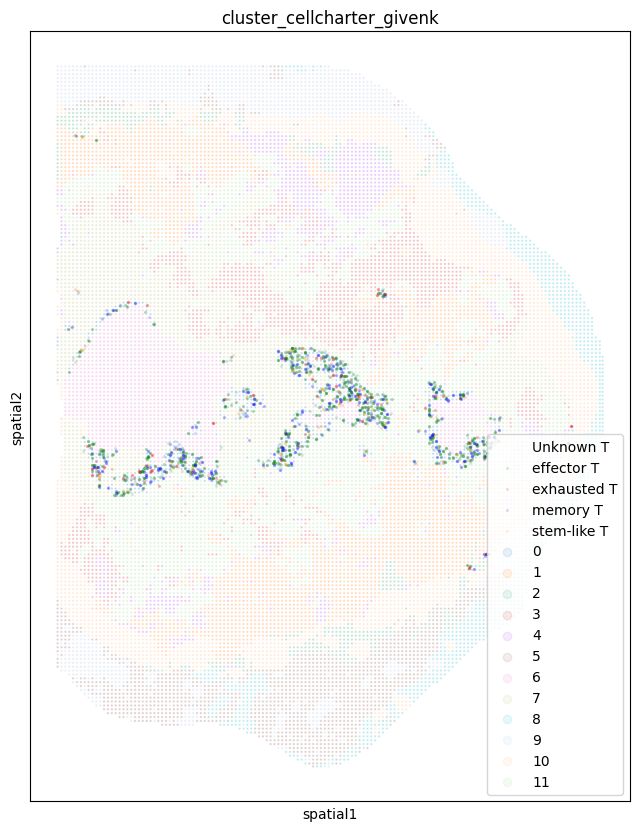

In [90]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
color_map = {
    'Unknown T': 'White',
    'effector T': 'Green',
    'exhausted T': 'Red',
    'memory T': 'Blue',
    'stem-like T': 'Orange'
}
marker = '1-1'
cluster = 0.0
for t_type, coords in r_dict[marker][cluster].items():
    x = coords[:, 0]
    y = coords[:, 1]
    ax.scatter(x, y, s=2, alpha=0.1, color=color_map[t_type], label=t_type)
fdata_ = fdata[(fdata.obs["marker"] == marker)].copy()
sq.pl.spatial_scatter(fdata_, color="cluster_cellcharter_givenk", size=2, shape=None, library_id="spatial", ax=ax, alpha=0.1)
plt.legend()

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. 

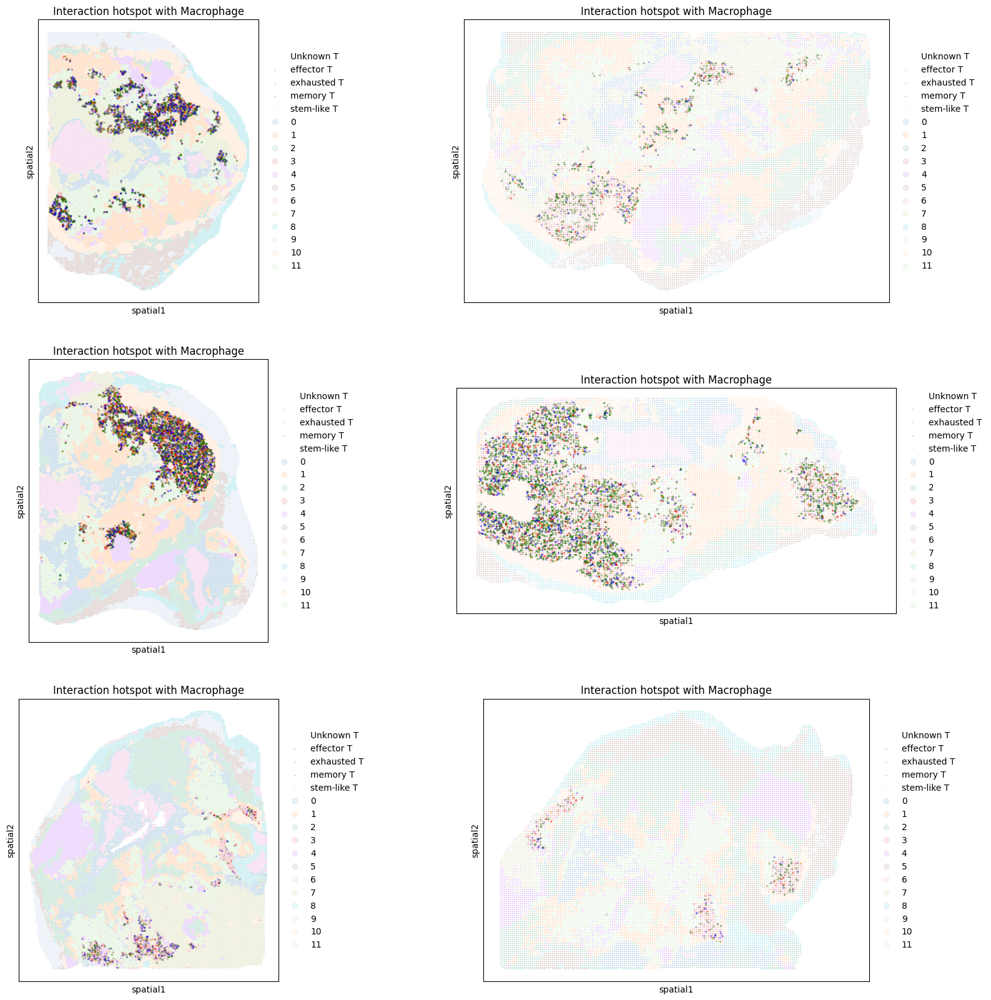

In [99]:
fig, axs = plt.subplots(3, 2, figsize=(20, 20))
color_map = {
    'Unknown T': 'White',
    'effector T': 'Green',
    'exhausted T': 'Red',
    'memory T': 'Blue',
    'stem-like T': 'Orange'
}
cluster = 3.0
for idx, marker in enumerate(np.unique(fdata.obs["marker"])):
    ax = axs[idx // 2, idx % 2]
    for t_type, coords in r_dict[marker][cluster].items():
        x = coords[:, 0]
        y = coords[:, 1]
        ax.scatter(x, y, s=2, alpha=0.1, color=color_map[t_type], label=t_type)
    fdata_ = fdata[(fdata.obs["marker"] == marker)].copy()
    sq.pl.spatial_scatter(fdata_, color="cluster_cellcharter_givenk", size=2, shape=None, library_id="spatial", ax=ax, alpha=0.1)
    ax.set_title("Interaction hotspot with Macrophage")
    ax.get_legend()

# Classify Macrophage

In [233]:
Macro_marker = {
    # "cDC1": ["CLEC9A", "FLT3", "IDO1"],
    # "cDC2": ["CD1C", "FCER1A"],
    # "cDC3": ["LAMP3", "CCR7", "FSCN1"],
    # "pDC": ["LILRA4", "GZMB", "IL3RA"],
    # "Mono_CD14": ["FCN1", "S100A9", "S100A8"],
    # "Mono_CD16": ["FCGR3A", "LST1", "LILRB2"],
    #"Macro_INHBA": ["INHBA", "IL1RN", "CCL4"],
    "Macro_SPP1": ["SPP1", "Vegfa", "Mmp12", "Adam8"],
    "Macro_NLRP3": ["NLRP3", "EREG", "IL1B"],
    "Macro_LYVE1": ["LYVE1", "PLTP", "SEPP1"],
    "Macro_C1QC": ["C1QC", "C1QA", "APOE"],
    # "Mast": ["KIT", "TPSAB1", "CPA3"],
}

In [202]:
def gene_mouse(str_):
    return [t[0] + t[1:].lower() for t in str_]

In [234]:
macro_data = annotation[annotation.obs["annotations"] == "Macrophages"].copy()

In [235]:
for m_marker in tqdm(Macro_marker):
    sc.tl.score_genes(macro_data, gene_list=gene_mouse(Macro_marker[m_marker]), score_name=m_marker + "_score")

 50%|█████     | 2/4 [00:05<00:05,  2.93s/it]

100%|██████████| 4/4 [00:11<00:00,  2.87s/it]


In [236]:
list(Macro_marker.keys())

['Macro_SPP1', 'Macro_NLRP3', 'Macro_LYVE1', 'Macro_C1QC']

In [237]:
m_marker_list = list(Macro_marker.keys())
macro_data.obs["m_type"] = (macro_data.obs.iloc[:, -4:][macro_data.obs.iloc[:, -4:].max(axis=1) > 0].apply(np.argmax, axis=1)).map(lambda x: m_marker_list[x])

In [238]:
macro_data.obs["m_type"].fillna("Macro_Unknown", inplace=True)

/tmp/ipykernel_19572/2902716949.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  macro_data.obs["m_type"].fillna("Macro_Unknown", inplace=True)


In [239]:
t_types = np.unique(annotation.obs["annotations"][annotation.obs["annotations"].str.endswith("T")])
m_types = np.unique(macro_data.obs["m_type"])

In [240]:
mc_df = macro_data.obs[["cluster", "m_type"]].groupby("cluster").value_counts().unstack()
mc_df = mc_df.div(mc_df.sum())

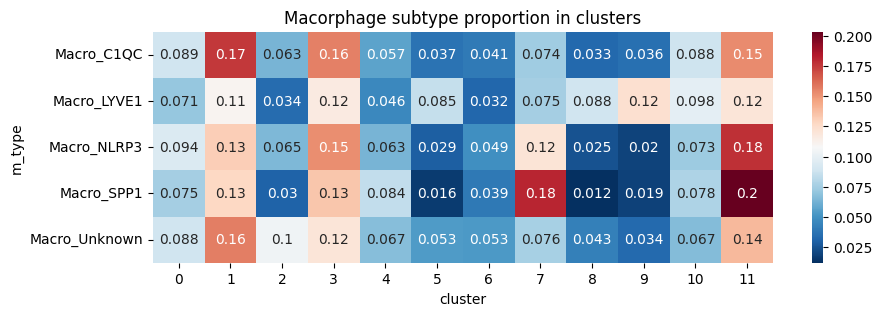

In [241]:
plt.figure(figsize=(10, 3))
sns.heatmap(mc_df.T, cmap="RdBu_r", annot=True)
plt.title("Macorphage subtype proportion in clusters")
plt.xticks([i+0.5 for i in range(12)], labels=range(12))
plt.show()

In [242]:
m_dict = {}
for marker in np.unique(annotation.obs["marker"]):
    m_dict[marker] = {}
    for cluster in tqdm(np.unique(annotation.obs["cluster"])):
        m_dict[marker][cluster] = {}
        for t_type in t_types:
            macro_annotation = macro_data[(macro_data.obs["marker"] == marker) & (macro_data.obs["cluster"] == cluster)]
            t_annotation = annotation[(annotation.obs["marker"] == marker) & (annotation.obs["cluster"] == cluster)]
            t_cell_idx = np.where(t_annotation.obs["annotations"] == t_type)[0]
            t_coords = t_annotation.obsm["spatial"][t_cell_idx]
            m_dict[marker][cluster][t_type] = []
            for m_type in m_types:
                m_cell_idx = np.where(macro_annotation.obs["m_type"] == m_type)[0]
                if len(t_cell_idx) == 0 or len(m_cell_idx) == 0:
                    m_dict[marker][cluster][t_type].append(0)
                    continue
                m_coords = macro_annotation[m_cell_idx].obsm["spatial"]
                distances = pairwise_distances(t_coords, m_coords)
                interactions = np.sum(distances < interaction_threshold)
                m_dict[marker][cluster][t_type].append(interactions / len(t_cell_idx) / len(m_cell_idx))

100%|██████████| 12/12 [00:08<00:00,  1.44it/s]


In [212]:
import itertools

In [243]:
m_df = pd.DataFrame()
cluster_index = list(itertools.chain(*[[float(i)] * 5 for i in range(12)]))
marker_index = ['1-1'] * 60 + ['1-2'] * 60 + ['2-1'] * 60 + ['2-2'] * 60 + ['3-1'] * 60 + ['3-2'] * 60
for marker in np.unique(annotation.obs["marker"]):
    c_df = pd.DataFrame()
    for cluster in np.unique(annotation.obs["cluster"]):
        new_df = pd.DataFrame(m_dict[marker][cluster])
        new_df.index = m_types
        c_df = pd.concat([c_df, new_df])
    c_df["cluster"] = cluster_index
    c_df.set_index(["cluster", c_df.index], inplace=True)
    m_df = pd.concat([m_df, c_df])
m_df["marker"] = marker_index
m_df.set_index(["marker", m_df.index], inplace=True)
m_df

Unknown T  effector T  exhausted T  memory T  \
marker cluster                                                               
1-1    0.0     Macro_C1QC      0.000320    0.000348     0.000334  0.000348   
               Macro_LYVE1     0.000436    0.000602     0.000434  0.000208   
               Macro_NLRP3     0.000314    0.000380     0.000096  0.000370   
               Macro_SPP1      0.000320    0.000378     0.000297  0.000292   
               Macro_Unknown   0.000361    0.000313     0.000404  0.000314   
...                                 ...         ...          ...       ...   
3-2    11.0    Macro_C1QC      0.000101    0.000111     0.000107  0.000108   
               Macro_LYVE1     0.000116    0.000125     0.000137  0.000080   
               Macro_NLRP3     0.000103    0.000091     0.000143  0.000161   
               Macro_SPP1      0.000104    0.000118     0.000122  0.000125   
               Macro_Unknown   0.000103    0.000113     0.000111  0.000095   

                              stem-like T  
marker cluster                             
1-1    0.0     Macro_C1QC        0.000366  
               Macro_LYVE1       0.000622  
               Macro_NLRP3       0.000415  
               Macro_SPP1        0.000114  
               Macro_Unknown     0.000281  
...                                   ...  
3-2    11.0    Macro_C1QC        0.000107  
               Macro_LYVE1       0.000000  
               Macro_NLRP3       0.000166  
               Macro_SPP1        0.000053  
               Macro_Unknown     0.000086  

[360 rows x 5 columns]

In [244]:
m_df = m_df.reset_index()

In [245]:
m_df = m_df.loc[:, m_df.columns != "cluster"]

In [246]:
m_df_melt = m_df.melt(id_vars=['marker', 'level_2'], var_name='T_type', value_name='value')

In [247]:
m_df_melt

,marker,level_2,T_type,value
0,1-1,Macro_C1QC,Unknown T,0.000320
1,1-1,Macro_LYVE1,Unknown T,0.000436
2,1-1,Macro_NLRP3,Unknown T,0.000314
3,1-1,Macro_SPP1,Unknown T,0.000320
4,1-1,Macro_Unknown,Unknown T,0.000361
...,...,...,...,...
1795,3-2,Macro_C1QC,stem-like T,0.000107
1796,3-2,Macro_LYVE1,stem-like T,0.000000
1797,3-2,Macro_NLRP3,stem-like T,0.000166
1798,3-2,Macro_SPP1,stem-like T,0.000053


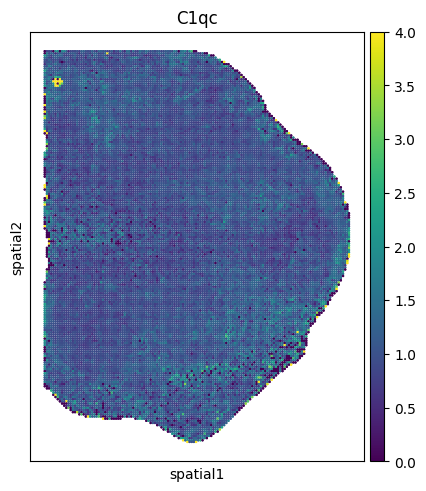

In [194]:
sq.pl.spatial_scatter(fdata[fdata.obs["marker"] == "1-1"], color="C1qc", size=2, shape=None, library_id="spatial", vmax=4)

In [248]:
colors = {
    'Macro_C1QC': 'lightblue',
    'Macro_SPP1': 'lightgreen',
    'Macro_LYVE1': 'lightcoral',
    'Macro_NLRP3': 'lightgoldenrodyellow',
    'Macro_Unknown': 'thistle'
}

/tmp/ipykernel_19572/2225500770.py:17: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([f"{ttype}" for ttype in data_to_plot['T_type'].unique()], rotation=90)
/tmp/ipykernel_19572/2225500770.py:17: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([f"{ttype}" for ttype in data_to_plot['T_type'].unique()], rotation=90)
/tmp/ipykernel_19572/2225500770.py:17: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([f"{ttype}" for ttype in data_to_plot['T_type'].unique()], rotation=90)
/tmp/ipykernel_19572/2225500770.py:17: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([f"{ttype}" for ttype in data_to

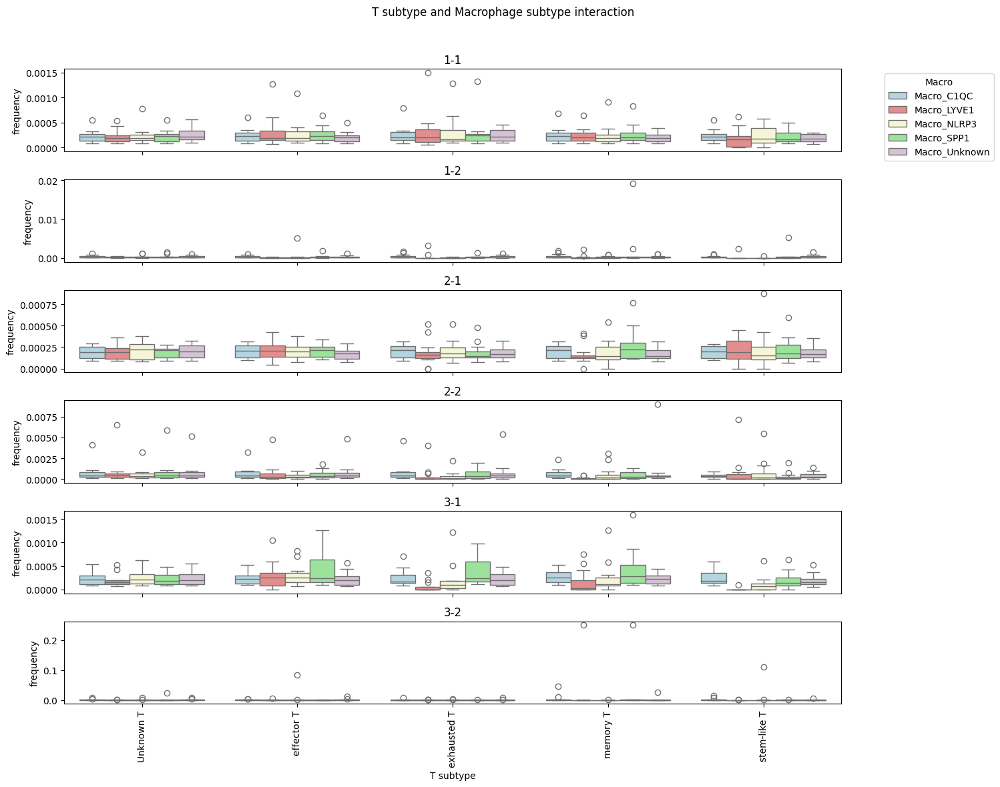

In [249]:
# 创建子图
markers = np.unique(annotation.obs["marker"])
fig, axs = plt.subplots(len(markers), 1, figsize=(15, 2 * len(markers)), sharex=True)

for ax, marker in zip(axs, markers):
    data_to_plot = m_df_melt[m_df_melt['marker'] == marker]
    sns.boxplot(
        data=data_to_plot,
        x='T_type',
        y='value',
        hue='level_2',
        palette=colors,
        ax=ax
    )
    
    # 设置 x 轴标签
    ax.set_xticklabels([f"{ttype}" for ttype in data_to_plot['T_type'].unique()], rotation=90)
    
    # 设置标题
    ax.set_title(f'{marker}')
    ax.set_ylabel("frequency")
    if marker == "1-1": ax.legend(title='Macro', bbox_to_anchor=(1.05, 1), loc='upper left')
    else: ax.get_legend().remove()

# 设置全局 x 轴标签和标题
plt.xlabel('T subtype')
plt.suptitle('T subtype and Macrophage subtype interaction')
plt.subplots_adjust(hspace=0)

# 调整子图布局
plt.tight_layout(rect=[0, 0, 1, 0.96])

# 显示图形
plt.show()

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of v

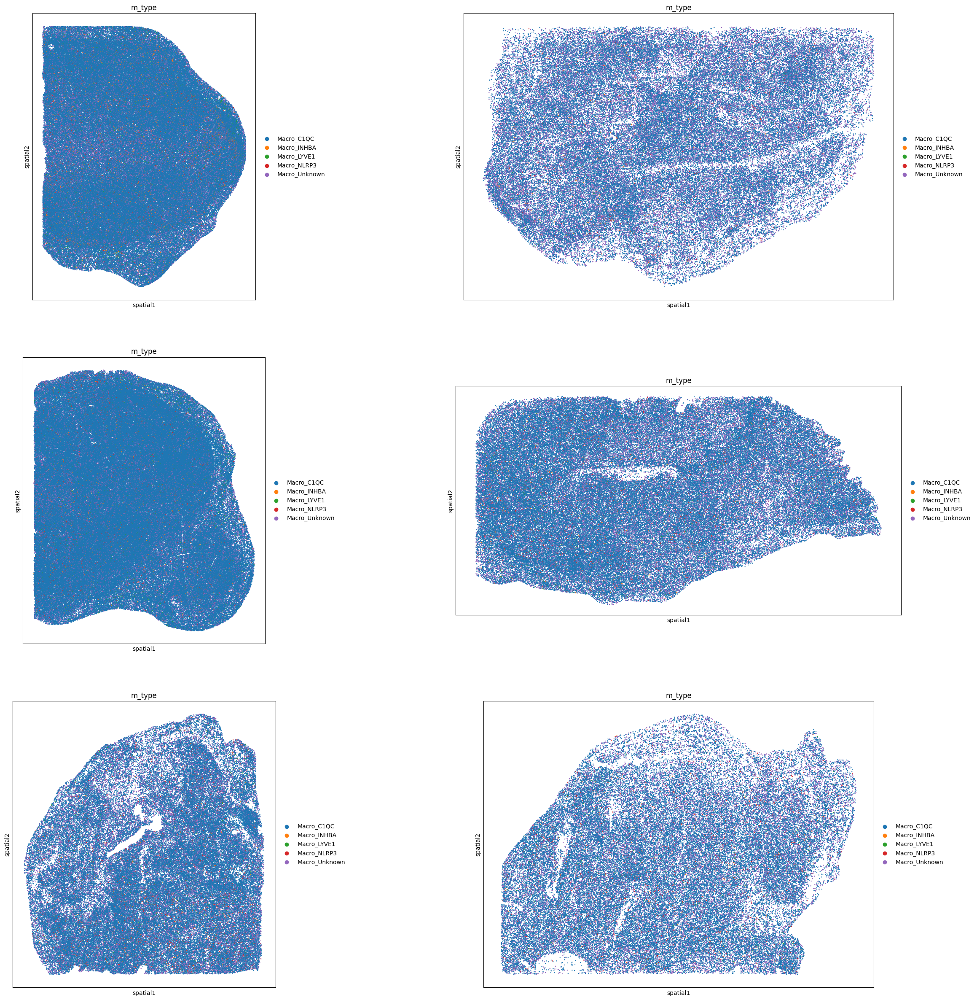

In [157]:
fig, axs = plt.subplots(3, 2, figsize=(30, 30))
utils.plot_score(macro_data[macro_data.obs["annotations"] == "Macrophages"], field="m_type", axs=axs, size=1)

/tmp/ipykernel_70496/1847707103.py:5: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[idx].set_xticklabels(labels=p_df.loc[marker].index, rotation=90)
/tmp/ipykernel_70496/1847707103.py:5: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[idx].set_xticklabels(labels=p_df.loc[marker].index, rotation=90)
/tmp/ipykernel_70496/1847707103.py:5: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[idx].set_xticklabels(labels=p_df.loc[marker].index, rotation=90)
/tmp/ipykernel_70496/1847707103.py:5: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[idx].set_xticklabels(labels=p_df.loc[marker].index, rotation=90)
/tmp/ipykernel_70496/1847707103.py:5: UserWarning: set_t

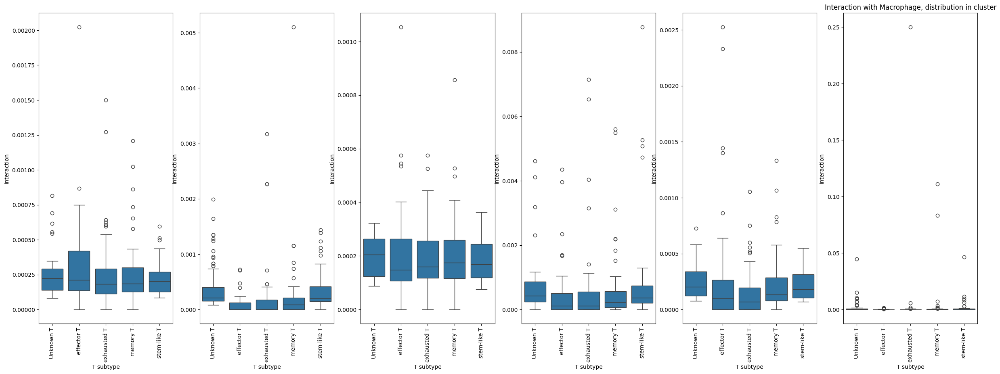

In [180]:
fig, ax = plt.subplots(1, 6, figsize=(30, 10))
for idx, marker in enumerate(np.unique(annotation.obs["marker"])):
    data = m_df_melt[m_df_melt["marker"] == marker]
    sns.boxplot(x="level_2", y="value", data=data, ax=ax[idx])
    ax[idx].set_xticklabels(labels=p_df.loc[marker].index, rotation=90)
    ax[idx].set_xlabel("T subtype")
    ax[idx].set_ylabel("Interaction")

plt.title("Interaction with Macrophage, distribution in cluster")
plt.show()

# Different Guide

In [191]:
data_list = ["./RNA/B924-1.guide.bin_20.h5", "./RNA/B926-1.guide.bin_20.h5", "./RNA/B922-1.guide.bin_20.h5",
             "./RNA/B924-2.guide.bin_20.h5", "./RNA/B926-2.guide.bin_20.h5", "./RNA/B922-2.guide.bin_20.h5"]
marker = ["1-1", "2-1", "3-1", "1-2", "2-2", "3-2"]
anndata_list = []
for idx, data in enumerate(data_list):
    anndata_ = sc.read_h5ad(data)
    anndata_.obs["marker"] = marker[idx]
    anndata_list.append(anndata_)

In [192]:
annotation_guide = ad.concat(anndata_list, join="outer")
annotation_guide.obs_names_make_unique()

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [193]:
annotation

View of AnnData object with n_obs × n_vars = 2910238 × 13177
    obs: 'marker', 'annotations', 'cov', 'cluster'
    var: 'mt', 'mt-', 'gm', 'Rb', 'rik'
    uns: 'rank_genes_groups'
    obsm: 'spatial'

In [194]:
annotation_guide

AnnData object with n_obs × n_vars = 2910460 × 69
    obs: 'marker'
    obsm: 'spatial'

In [195]:
annotation_guide[:, "sgNTC"].X = annotation_guide[:, "sgnon-targeting_1_gene"].X + annotation_guide[:, "sgnon-targeting_2_gene"].X + annotation_guide[:, "sgNTC"].X
annotation_guide = annotation_guide[:, ~annotation_guide.var_names.str.startswith("sgnon")].copy()

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scipy/sparse/_index.py:142: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


In [197]:
annotation, annotation_guide = utils.align_rna_guide_data(annotation, annotation_guide)

/home/wpy/stereoseq/20240502-SPACseq/bin/utils.py:124: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  rnadata.obs["cov"] = [str(marker) + '_' + str(array[0]) + "-" + str(array[1]) for marker, array in zip(rnadata.obs[marker_name], rnadata.obsm["spatial"])]


In [200]:
annotation_guide.write_h5ad("./RNA/Multitime.annotation.guide.h5")

In [201]:
annotation.write_h5ad("./RNA/Multitime.annotation.sort.h5")

In [10]:
annotation = sc.read_h5ad("./RNA/Multitime.annotation.sort.h5")
annotation_guide = sc.read_h5ad("./RNA/Multitime.annotation.guide.h5")

In [11]:
annotation_guide = utils.combine_guide_replicates(annotation_guide)

/home/wpy/stereoseq/20240502-SPACseq/bin/utils.py:78: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sgs_grouped = sgs_grouped.groupby(sgs, axis=1).sum()


In [13]:
cdata = utils.combine_guide_replicates(cdata)

/home/wpy/stereoseq/20240502-SPACseq/bin/utils.py:78: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sgs_grouped = sgs_grouped.groupby(sgs, axis=1).sum()


In [241]:
np.array(annotation_guide.X.sum(axis=1) > 0)

array([False, False,  True, ..., False, False, False])

In [14]:
# Number of bin20s with guide and T cells
mask = (annotation.obs["annotations"].str.endswith("T").tolist() & np.array(annotation_guide.X.sum(axis=1) > 0))
tdata = annotation_guide[mask]

<BarContainer object of 34 artists>

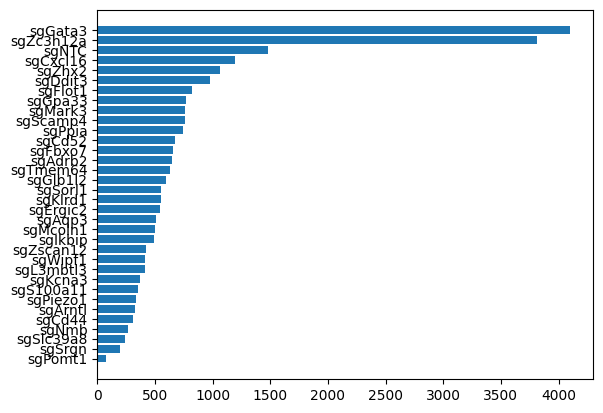

In [15]:
c_df = pd.DataFrame(tdata.var_names[np.array(tdata.X.argmax(axis=1))].value_counts()).sort_values(by="count", ascending=True)
plt.barh(c_df.index, c_df["count"])

In [19]:
fdata, cdata = utils.align_rna_guide_data(fdata, cdata)

In [20]:
annotation_guide.obs["cluster"] = annotation.obs["cluster"].tolist()

In [78]:
guide_idx_dict = {}
mask = (annotation.obs["annotations"].str.endswith("T").tolist() & np.array(annotation_guide.X.sum(axis=1) > 0))
tdata = annotation_guide[mask]
max_list = tdata.var_names[np.array(tdata.X.argmax(axis=1))]
for guide in tqdm(annotation_guide.var_names):
    guide_idx_dict[guide] = {}
    t_annotation = tdata[np.where(max_list == guide)[0]]
    for cluster in np.unique(annotation.obs["cluster"]):
        guide_idx_dict[guide][cluster] = []
        for marker in np.unique(annotation.obs["marker"]):
            macro_annotation = annotation[(annotation.obs["marker"] == marker) & (annotation.obs["cluster"] == cluster)]
            macro_coords = macro_annotation[macro_annotation.obs["annotations"] == "Macrophages"].obsm["spatial"]
            t_coords = t_annotation[(t_annotation.obs["marker"] == marker) & (t_annotation.obs["cluster"] == cluster)].obsm["spatial"]

            if macro_coords.shape[0] == 0 or t_coords.shape[0] == 0:
                guide_idx_dict[guide][cluster].append(0)
                continue
            distances = pairwise_distances(macro_coords, t_coords)
            interactions = np.sum(distances < interaction_threshold)
            guide_idx_dict[guide][cluster].append(interactions / t_coords.shape[0])

100%|██████████| 34/34 [08:25<00:00, 14.88s/it]


In [40]:
t_coords

ArrayView([[ 3609, 10829],
           [ 3929,  3949],
           [ 4169, 10928],
           [ 4589,  4029],
           [ 5089,  9569],
           [ 6129,  7769],
           [ 7969, 12369],
           [ 8129,  8049]])

In [52]:
pd.DataFrame(pd.DataFrame(guide_idx_dict).T[0.0].to_dict()).melt()

,variable,value
0,sgAdrb2,0.000314
1,sgAdrb2,0.000422
2,sgAdrb2,0.000125
3,sgAdrb2,0.000252
4,sgAdrb2,0.000000
...,...,...
199,sgZscan12,0.000337
200,sgZscan12,0.000080
201,sgZscan12,0.000261
202,sgZscan12,0.000426


/tmp/ipykernel_19572/2579511614.py:11: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(cdata.var_names, rotation=90)


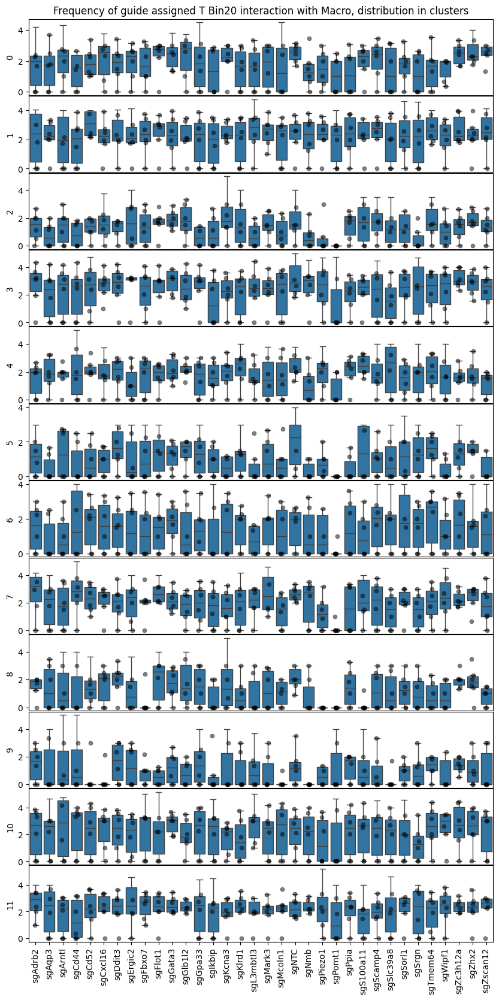

In [79]:
fig, axs = plt.subplots(12, 1, figsize=(10, 20))

axs[0].set_title("Frequency of guide assigned T Bin20 interaction with Macro, distribution in clusters")
for idx, cluster in enumerate(np.unique(annotation.obs["cluster"])):
    idf = pd.DataFrame(pd.DataFrame(guide_idx_dict).T[cluster].to_dict()).melt()

    ax = axs[idx]
    sns.boxplot(x="variable", y="value", data=idf, showfliers=False, ax=ax)
    sns.stripplot(data=idf[(idf.value < np.quantile(idf.value, 0.95))], x='variable', y='value', dodge=True, marker='o', alpha=0.5, jitter=True, linewidth=0.5, color="black", ax=ax)
    if idx == 11:
        ax.set_xticklabels(cdata.var_names, rotation=90)
    else:
        ax.set_xticklabels([])
        ax.set_xticks([])
    ax.set_xlabel("")
    ax.set_ylabel(f"{idx}")
plt.subplots_adjust(hspace=0.01)
plt.show()

In [84]:
np.array([1, 1, 2, 2, 3, 3] * 34).shape

(204,)

In [86]:
v_df = pd.DataFrame(pd.DataFrame(guide_idx_dict).T[3.0].to_dict()).melt()
v_df["time_point"] =  np.array([1, 1, 2, 2, 3, 3] * 34)
v_df

,variable,value,time_point
0,sgAdrb2,3.235294,1
1,sgAdrb2,1.958333,1
2,sgAdrb2,4.352941,2
3,sgAdrb2,3.112245,2
4,sgAdrb2,0.000000,3
...,...,...,...
199,sgZscan12,2.200000,1
200,sgZscan12,4.000000,2
201,sgZscan12,3.178571,2
202,sgZscan12,0.000000,3


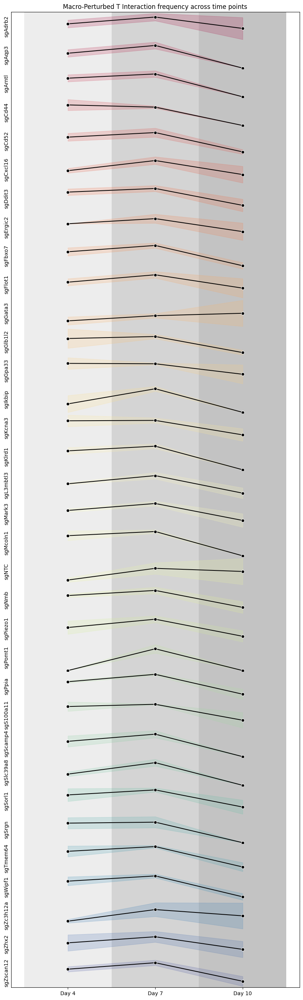

In [125]:
# 获取不同的变量
variables = v_df['variable'].unique()

# 创建子图，调整子图的纵向大小和间距
fig, axs = plt.subplots(len(variables), 1, figsize=(10, 1 * len(variables)), sharex=True, gridspec_kw={'hspace': 0})

# 定义颜色调色板
palette = sns.color_palette("Spectral", len(variables))

# 定义背景颜色
bg_colors = ['#dddddd', '#aaaaaa', '#888888']  # 浅蓝、浅红、浅绿

# 绘制每个子图
for idx, (ax, variable, color) in enumerate(zip(axs, variables, palette)):
    data_to_plot = v_df[v_df['variable'] == variable]
    
    # 添加背景色
    for i, bg_color in enumerate(bg_colors):
        ax.axvspan(i + 0.5, i + 1.5, facecolor=bg_color, alpha=0.5)
    
    # 绘制线条图
    sns.lineplot(
        data=data_to_plot,
        x='time_point',
        y='value',
        marker='o',
        ax=ax,
        color=color,
        label=variable
    )
    
    # 手动设置误差棒的颜色
    for line in ax.get_lines():
        line.set_linestyle('-')  # 设置线条样式
        line.set_color("black")  # 设置线条颜色

    # 只为第一个图设置标题
    if idx == 0:
        ax.set_title('Macro-Perturbed T Interaction frequency across time points')
    
    # y轴标签为变量名
    ax.set_ylabel(variable)
    ax.set_yticks([])
    
    # 最后一张图设置x轴标签
    if idx == len(axs) - 1:
        ax.set_xlabel('Time Point')
        ax.set_xticks([1, 2, 3])
        ax.set_xticklabels(['Day 4', 'Day 7', 'Day 10'])
    else:
        ax.set_xticklabels([])
        ax.set_xticks([])

    # 移除每个子图的图例
    ax.get_legend().remove()

    # 只保留最外圈的边框，去除子图之间的边框
    for spine in ax.spines.values():
        spine.set_visible(False)
    if idx == 0:
        ax.spines['top'].set_visible(True)
    if idx == len(axs) - 1:
        ax.spines['bottom'].set_visible(True)
    ax.spines['left'].set_visible(True)
    ax.spines['right'].set_visible(True)

# 调整子图之间的间隔
plt.subplots_adjust(hspace=0)

# 显示图形
plt.show()